<a href="https://colab.research.google.com/github/Siwan-SR/end-to-end-dog-vision/blob/main/end-to-end-dog-vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
/ There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
# Import necessary tools

import tensorflow as tf
import tensorflow_hub as hub

print(f"Tensorflow version: {tf.__version__}")
print(f"Tensorflow Hub version: {hub.__version__}")

# Check for GPU availability

print("GPU", "available." if tf.config.list_physical_devices("GPU") else "not available.")

Tensorflow version: 2.9.2
Tensorflow Hub version: 0.12.0
GPU available.


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data

labels_csv = pd.read_csv("/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/labels.csv")

print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


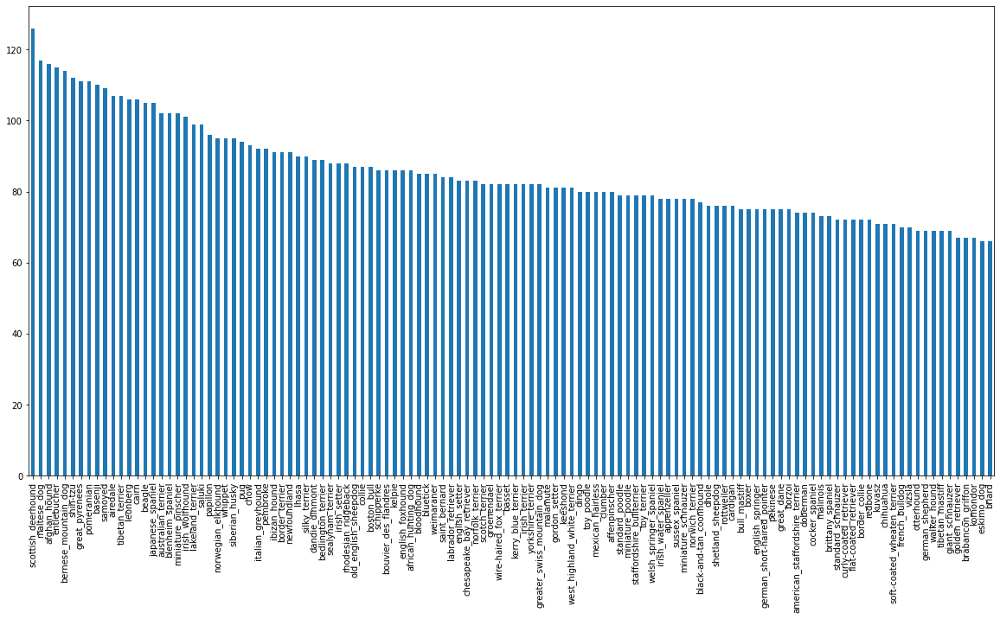

In [ ]:
# How many images are there of each breed?

labels_csv["breed"].value_counts().plot.bar(figsize = (20, 10));

In [ ]:
# What's the median number of images per class?

labels_csv["breed"].value_counts().median()

82.0

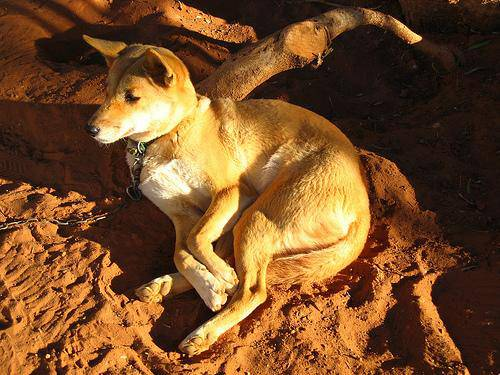

In [ ]:
# Let's view an image

from IPython.display import Image

Image("/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames.

In [ ]:
# Create pathnames from image ID'

filenames = ["/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10

filenames[:10]

['/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyD

In [ ]:
# Check whether number of filenames matches number of actual image files

import os

if len(os.listdir("/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train")) == len(filenames):
    print("Filenames match actual amount of files. Proceed.")

else:
    print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files. Proceed.


In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [ ]:
labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number of labels matches the number of filenames

if len(labels) == len(filenames):
    print("Number of labels match the number of filenames.")

else:
    print("Number of labels do not match the number of filenames. Check data directories.")

Number of labels match the number of filenames.


In [ ]:
# Find the unique label names

unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(labels)

10222

In [ ]:
# Turn a single label into an array of booleans

print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array

boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers

print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyD

Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variables

X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting

NUM_IMAGES = 1000 # @param{type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets

from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size = 0.2, random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data

X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
      

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an `image` filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`
7. Before we do, let's see what importing an `image` looks like.

In [ ]:
# Convert image to NumPy array

from matplotlib.pyplot import imread

image = imread(filenames[42]) # read in an image
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max

<function ndarray.max>

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# turn image into a tensor

tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

We'll create a function to:

1. Take an `image` filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`
7. Before we do, let's see what importing an `image` looks like.

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [ ]:
# Define image size

IMG_SIZE = 224

# Create a function for preprocesssing images

def process_image(image_path):
    """
    Takes an image file path and turns the image into a Tensor.

    """

    # Read in an image file
    image = tf.io.read_file(image_path)

    # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
    image = tf.image.decode_jpeg(image, channels = 3)

    # Convert the colour channel values from 0-255 to 0-1 values
    image = tf.image.convert_image_dtype(image, tf.float32)

    # Resize the image to our desired value (224, 224)
    image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

    return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`.

In [ ]:
# Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
    """
    Takes an image file path name and the assosciated label,
    processes the image and reutrns a typle of (image, label).
    
    """

    image = process_image(image_path)
    return image, label

In [ ]:
# Demo of the above

(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form:   `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start

BATCH_SIZE = 32

# Create a function to turn data into batches

def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
    """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).

    """
    # If the data is a test dataset, we probably don't have have labels

    if test_data:
        print("Creating test data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
        data_batch = data.map(process_image).batch(BATCH_SIZE)
        return data_batch
    
    # If the data is a valid dataset, we don't need to shuffle it

    elif valid_data:
        print("Creating validation data batches...")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                tf.constant(y))) # labels
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

    else:
        print("Creating training data batches...")

        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                tf.constant(y)))
        
        # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
        data = data.shuffle(buffer_size=len(X))

        # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
        data = data.map(get_image_label)

        # Turn the training data into batches
        data_batch = data.batch(BATCH_SIZE)
        
    return data_batch

In [ ]:
# Create training and validation data batches

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
# Create a function for viewing images in a data batch

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.

  """
  # Setup the figure
  plt.figure(figsize = (10, 10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i + 1)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

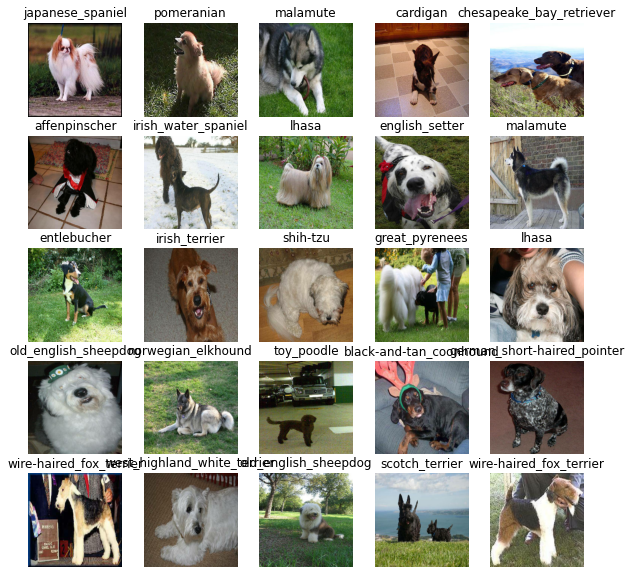

In [ ]:
# Now let's visualize the data in a training batch

train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

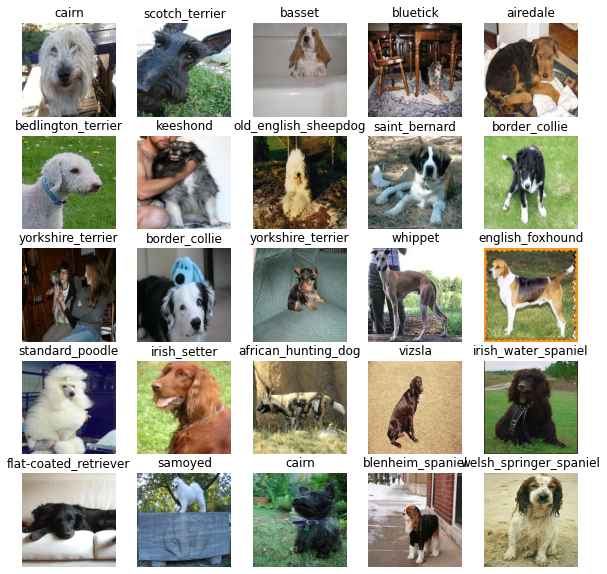

In [ ]:
# Now let's visualize our validation set

val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model

INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model

OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
INPUT_SHAPE

[None, 224, 224, 3]

Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
    print(f"Building model with: {MODEL_URL}")

    # Setup model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
        tf.keras.layers.Dense(units = OUTPUT_SHAPE, activation = "softmax") # Layer 2 (output layer)
        ])
    
    # Compile the model
    model.compile(
        loss = tf.keras.losses.CategoricalCrossentropy(),
        optimizer = tf.keras.optimizers.Adam(),
        metrics = ["accuracy"]
        )
    
    # Build the model
    model.build(INPUT_SHAPE)

    return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
output = np.ones(shape = (1, 1, 1280))
output

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function. ✅
3. Visualize our models training logs with the `%tensorboard magic` function(we'll do this after model training).

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
# Load TensorBoard notebook extension

%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback

def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy", patience = 3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Check to make sure we're still running on a GPU

print("GPU", "available." if tf.config.list_physical_devices("GPU") else "not available.")

GPU available.


In [ ]:
# Build a function to train and return a trained model

def train_model():
    """
    Trains a given model and returns the trained version.

    """

    # Create a model
    model = create_model()

    # Create new TensorBoard session everytime we train a model
    tensorboard = create_tensorboard_callback()
  
    # Fit the model to the data passing it the callbacks we created
    model.fit(x = train_data,
              epochs = NUM_EPOCHS,
              validation_data = val_data,
              validation_freq = 1,
              callbacks = [tensorboard, early_stopping])
    
    # Return the fitted model
    return model

In [ ]:
# Fit the model to the data

model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 14s 190ms/step - loss: 4.6386 - accuracy: 0.0825 - val_loss: 3.5022 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 157ms/step - loss: 1.6519 - accuracy: 0.7038 - val_loss: 2.1721 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 3s 136ms/step - loss: 0.5727 - accuracy: 0.9362 - val_loss: 1.7205 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 144ms/step - loss: 0.2563 - accuracy: 0.9887 - val_loss: 1.5486 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - 5s 217ms/step - loss: 0.1486 - accuracy: 0.9962 - val_loss: 1.4615 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 4s 141ms/step - loss: 0.1012 - accuracy: 0.9987 - val_loss: 1.4148 - val_accuracy: 0.6150
Epoch 7/100
25/25 [=============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/logs"

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)

predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 104ms/step


array([[2.5764827e-03, 1.1429453e-04, 8.4969017e-04, ..., 5.3871679e-04,
        8.5981803e-05, 5.6040208e-03],
       [7.1706332e-04, 6.7098672e-04, 2.0769415e-03, ..., 5.9182872e-04,
        8.3238573e-04, 3.6220843e-04],
       [4.2296401e-06, 7.1466726e-05, 1.8577453e-05, ..., 1.8838000e-05,
        2.2771972e-05, 4.2148907e-04],
       ...,
       [2.2746397e-05, 7.0996488e-05, 1.6395792e-05, ..., 5.3303552e-06,
        5.0126907e-04, 2.3188384e-04],
       [4.6447846e-03, 4.2938106e-04, 8.8962646e-05, ..., 4.1549897e-04,
        5.1937397e-05, 8.4649548e-03],
       [4.3685891e-04, 2.5542375e-05, 2.2971514e-03, ..., 5.8704836e-04,
        9.7848126e-04, 7.1675538e-05]], dtype=float32)

In [ ]:
predictions[0]

array([2.57648272e-03, 1.14294533e-04, 8.49690172e-04, 4.83011536e-05,
       9.17586585e-05, 3.01672826e-05, 5.75633906e-02, 2.52467638e-04,
       9.91001143e-04, 3.90886911e-04, 8.95894540e-04, 9.45867432e-05,
       4.16959752e-04, 7.52708729e-05, 5.76301827e-04, 3.04963523e-05,
       9.28900481e-05, 1.48166642e-01, 1.09810535e-05, 1.38217816e-04,
       1.74530331e-04, 1.62139622e-04, 5.64808106e-05, 1.10865210e-03,
       8.04548399e-05, 2.31112848e-04, 3.25039059e-01, 1.68646293e-04,
       1.13053393e-04, 1.11651595e-03, 1.82745993e-04, 8.16081534e-04,
       6.98136631e-04, 2.05369379e-05, 1.72476175e-05, 2.29096673e-02,
       2.83484351e-05, 2.37494838e-04, 2.91587843e-04, 7.05830695e-04,
       2.55608512e-03, 2.26257762e-05, 6.77683041e-04, 1.89553364e-04,
       1.40140008e-04, 2.99074687e-04, 1.69620907e-05, 1.98448659e-04,
       3.94031580e-04, 3.36868892e-04, 9.95054870e-05, 2.18603935e-04,
       1.17362237e-04, 8.35864994e-05, 1.24822007e-04, 2.85548536e-04,
      

In [ ]:
# First prediction

index = 42

print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.54867070e-04 8.09379053e-05 4.68187900e-05 1.68812825e-04
 1.52187445e-03 1.29744119e-04 8.61342196e-05 1.13177951e-03
 1.06701199e-02 3.27899717e-02 2.03607833e-05 2.36574251e-05
 1.81874944e-04 1.16589414e-02 1.12654921e-03 3.44134448e-03
 4.09158347e-05 1.05284635e-04 9.41267499e-05 2.47039454e-04
 2.42220485e-05 7.21229066e-04 1.23275413e-05 1.26061495e-04
 2.34825052e-02 1.13464717e-04 5.00188544e-05 9.05281413e-05
 6.22395601e-05 7.16418654e-05 2.31016136e-04 8.94000332e-05
 1.93552351e-05 3.62227111e-05 2.84396119e-05 9.67066153e-05
 5.52946949e-05 4.12191497e-04 5.78549152e-05 2.65557379e-01
 1.66163489e-04 2.30297137e-05 5.38212340e-03 7.32788294e-06
 5.03299292e-04 3.63357103e-05 2.22905845e-04 2.05618402e-04
 2.64976370e-05 2.93824938e-04 1.39681026e-04 6.64149775e-05
 1.40369812e-04 6.54933462e-03 1.46128305e-05 5.24319650e-04
 1.75354537e-04 2.54088063e-05 2.08162222e-04 3.57520958e-06
 3.66838540e-05 5.40382520e-04 3.36080006e-06 1.38853120e-05
 7.50547697e-05 8.313686

In [ ]:
unique_breeds[113]

'walker_hound'

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
    """
    Turns an array of prediction probabilities into a label.

    """

    return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities

pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset

def unbatchify(data):
    """
    Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
    of images and labels.

    """

    images = []
    labels = []

    # Loop through unbatched data

    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])

    return images, labels

# Unbatchify the validation data

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
    * Prediction probabilities indexes ✅
    * Prediction probabilities values ✅
    * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):

    """

    View the prediction, ground truth and image for sample n

    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the pred label
    pred_label = get_pred_label(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the colour of the title depending on if the prediction is right or wrong

    if pred_label == true_label:
        color = "green"

    else:
        color = "red"
    
    # Change plot title to be predicted, probability of prediction and truth label
    
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                        np.max(pred_prob) * 100,
                                        true_label),
                                        color = color)

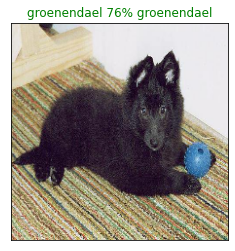

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plus the top 10 highest prediction confidences along with the truth label for sample n.

    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = get_pred_label(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]

    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                        top_10_pred_values,
                        color = "grey")
    
    plt.xticks(np.arange(len(top_10_pred_labels)),
                labels = top_10_pred_labels,
                rotation  ="vertical")
    
    # Change color of true label

    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

    else:
        pass

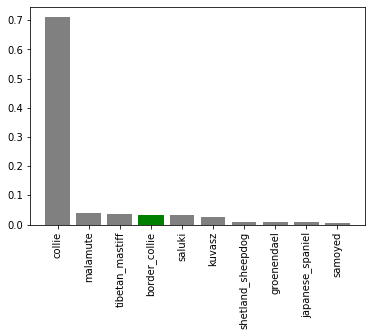

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 9)

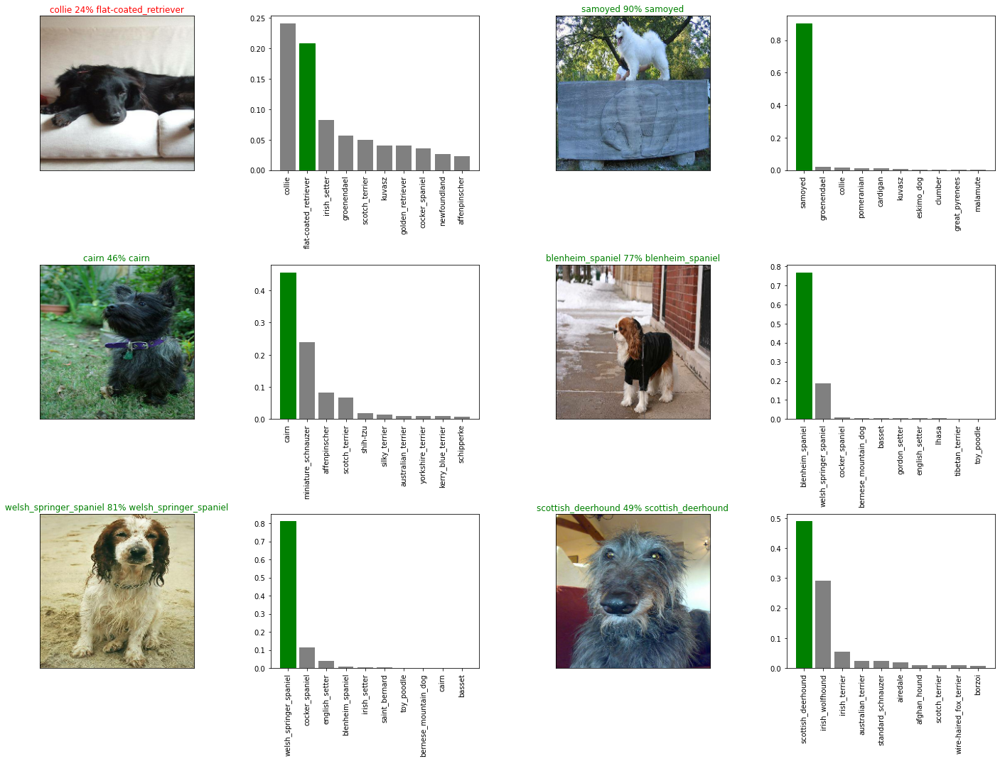

In [ ]:
# Let's check out a few predictions and their different values

i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize = (10 * num_cols, 5 * num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)

  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i + i_multiplier)
  
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i + i_multiplier)
  
plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model

def save_model(model, suffix = None):
    """
    Saves a given model in a models directory and appends a suffix (string).
    """

    # Create a model directory pathname with current time

    modeldir = os.path.join("/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
    
    model_path = modeldir + "-" + suffix + ".h5" # save format of model
    print(f"Saving model to: {model_path}...")
    
    model.save(model_path)
    return model_path

In [ ]:
# Create a function to load a trained model

def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """

  print(f"Loading saved model from: {model_path}")

  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images

save_model(model, suffix = "1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/models/20221021-10481666349324-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/models/20221021-10481666349324-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model

loaded_1000_image_model = load_model("/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/models/20221019-19511666209085-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/models/20221019-19511666209085-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model

model.evaluate(val_data)

7/7 [==============================] - 1s 94ms/step - loss: 1.2934 - accuracy: 0.6350


[1.293433427810669, 0.6349999904632568]

In [ ]:
# Evaluate the loaded model

loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 92ms/step - loss: 1.2607 - accuracy: 0.6850


[1.2607009410858154, 0.6850000023841858]

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full data set

full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks

full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience = 3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data

# full_model.fit(x = full_data,
#                epochs = NUM_EPOCHS,
#                callbacks = [full_model_tensorboard, full_model_early_stopping])

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/models/20221021-10481666349333-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/models/20221021-10481666349333-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model

loaded_full_model = load_model("/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/models/20221020-13581666274292-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/models/20221020-13581666274292-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the test_data parameter to `True` (since the `test data` doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames

test_path = "/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/test/deac194013c246095f0e88cd8b6b90d2.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/test/e66eb9532985301394e1bfb8f05206d4.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/test/dce8d03553ab29570f67a28bf0ee0709.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/test/e6e8ae7dc0e71c6ae868fd3371fde010.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/test/e43f6e621469f438f351d31d889b839f.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/test/e59d59ffbb65d9eae166d4068af5d9b9.jpg',
 '/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/data/test/e425ab04e3a0d4464cda46a076964770.jpg',
 '/content/drive/MyDrive/Ma

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch

test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model

# test_predictions = loaded_full_model.predict(test_data, verbose = 1)

In [ ]:
# Save predictions (NumPy array) to csv file (for access later)

# np.savetxt("/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/preds_array.csv", test_predictions, delimiter = ",")

In [ ]:
# Load predictions (NumPy array) from csv file

test_predictions = np.loadtxt("/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/preds_array.csv", delimiter = ",")

In [ ]:
test_predictions[:10]

array([[2.85630652e-09, 1.62769247e-08, 4.20216351e-09, ...,
        1.73812449e-08, 3.38418875e-04, 2.16147714e-06],
       [5.92634219e-10, 2.85206928e-12, 1.64419092e-08, ...,
        1.45355312e-04, 2.10040660e-08, 2.37087061e-08],
       [4.15361523e-09, 5.42509017e-13, 3.81115148e-12, ...,
        7.70867398e-11, 4.39545325e-08, 4.90191091e-12],
       ...,
       [1.47185492e-04, 9.12705078e-10, 1.20006027e-09, ...,
        3.46432110e-08, 5.95344052e-11, 1.97888562e-03],
       [9.37780235e-12, 1.69456604e-09, 6.15455256e-11, ...,
        1.11078971e-05, 4.14968193e-09, 1.76048499e-12],
       [8.30145286e-09, 3.11728521e-14, 3.01662084e-10, ...,
        2.66387259e-12, 1.29985196e-07, 1.15392895e-11]])

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with empty columns

preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame

test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,deac194013c246095f0e88cd8b6b90d2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e66eb9532985301394e1bfb8f05206d4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dce8d03553ab29570f67a28bf0ee0709,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6e8ae7dc0e71c6ae868fd3371fde010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e43f6e621469f438f351d31d889b839f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle

preds_df.to_csv("/content/drive/MyDrive/Machine Learning and Data Science/projects/end-to-end-dog-vision/full_model_predictions_submission_1_mobilenetV2.csv", index=False)